In [1]:
import glob

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

from pylab import rcParams

from utils import METRICS, CONT_PARAMETERS, LOG_PARAMETERS, SET_PARAMETERS, INT_PARAMETERS, read_files,\
    top_mean_dev_auc, top_min_whole_validation_auc, top_min_dev_auc, read_files

In [2]:
rcParams['figure.figsize'] = 20, 5
pd.set_option('display.max_columns', None)

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
files = ['./experiments/good-5fold-3seed.pkl']

In [5]:
top_k = 100000
min_iterations = 50

In [6]:
best_mean_dev = top_mean_dev_auc(read_files(files), top_k)\
    .pipe(lambda x: x[x.groupby(['file', 'experiment_id']).iteration.transform('size') > min_iterations])
best_mean_dev.groupby(['file', 'experiment_id']).ngroups

294

In [7]:
best_min_dev = top_min_dev_auc(read_files(files), top_k)\
    .pipe(lambda x: x[x.groupby(['file', 'experiment_id']).iteration.transform('size') > min_iterations])
best_min_dev.groupby(['file', 'experiment_id']).ngroups

294

In [8]:
true_best = top_min_whole_validation_auc(read_files(files), top_k)\
    .pipe(lambda x: x[x.groupby(['file', 'experiment_id']).iteration.transform('size') > min_iterations])
true_best.groupby(['file', 'experiment_id']).ngroups

327

In [9]:
compare_columns = ['mean_dev_auc', 'mean_validation_auc',
               'mean_whole_validation_auc', 'min_dev_auc', 'min_validation_auc', 'min_whole_validation_auc']

In [10]:
best_mean_dev[compare_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
mean_dev_auc,99545.0,0.831381,0.001422,0.829038,0.830099,0.831413,0.832524,0.834470
mean_validation_auc,99545.0,0.807705,0.002126,0.796881,0.806654,0.807725,0.809126,0.814007
mean_whole_validation_auc,99545.0,0.807646,0.002543,0.794753,0.806241,0.807891,0.809338,0.814639
min_dev_auc,99545.0,0.819760,0.002502,0.809736,0.818053,0.820095,0.821654,0.825348
min_validation_auc,99545.0,0.804598,0.002681,0.790714,0.803034,0.804707,0.806389,0.812280
min_whole_validation_auc,99545.0,0.806864,0.002755,0.791515,0.805295,0.807144,0.808786,0.814103


In [11]:
best_mean_dev.min_whole_validation_auc.corr(best_mean_dev.mean_dev_auc, method='spearman')

0.3049039007115362

In [12]:
best_mean_dev.mean_whole_validation_auc.corr(best_mean_dev.mean_dev_auc, method='spearman')

0.2394595404640655

In [13]:
best_min_dev[compare_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
mean_dev_auc,99086.0,0.831085,0.001871,0.824647,0.829870,0.831380,0.832529,0.834470
mean_validation_auc,99086.0,0.807544,0.002572,0.793525,0.806482,0.807879,0.809211,0.814007
mean_whole_validation_auc,99086.0,0.807382,0.003045,0.789404,0.805964,0.807839,0.809446,0.814639
min_dev_auc,99086.0,0.820209,0.001910,0.816985,0.818711,0.820204,0.821658,0.825348
min_validation_auc,99086.0,0.804514,0.003145,0.786036,0.802877,0.804923,0.806794,0.812280
min_whole_validation_auc,99086.0,0.806696,0.003217,0.789404,0.805177,0.807249,0.808953,0.814103


In [14]:
best_min_dev.min_whole_validation_auc.corr(best_min_dev.min_dev_auc, method='spearman')

0.1703800204736031

In [15]:
best_min_dev.min_whole_validation_auc.corr(best_min_dev.mean_dev_auc, method='spearman')

0.2840931816675695

In [16]:
true_best[compare_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
mean_dev_auc,98789.0,0.828423,0.011672,0.500000,0.827034,0.829940,0.832187,0.834470
mean_validation_auc,98789.0,0.806903,0.010781,0.500000,0.806736,0.808043,0.809326,0.814007
mean_whole_validation_auc,98789.0,0.808934,0.001377,0.806511,0.807891,0.808726,0.809803,0.814639
min_dev_auc,98789.0,0.816251,0.017826,0.500000,0.815347,0.818297,0.820806,0.825348
min_validation_auc,98789.0,0.803514,0.016951,0.500000,0.803659,0.805363,0.806966,0.812280
min_whole_validation_auc,98789.0,0.808365,0.001348,0.806511,0.807283,0.808136,0.809250,0.814103


In [17]:
true_best.min_whole_validation_auc.corr(true_best.min_dev_auc, method='spearman')

0.33872052514471557

In [18]:
true_best.min_whole_validation_auc.corr(true_best.mean_dev_auc, method='spearman')

0.2910603307100858

In [19]:
true_best.mean_whole_validation_auc.corr(true_best.min_dev_auc, method='spearman')

0.2659256408478782

In [20]:
true_best.mean_whole_validation_auc.corr(true_best.mean_dev_auc, method='spearman')

0.24867785557780658

In [21]:
best_mean_dev.merge(true_best, on=['file', 'experiment_id', 'iteration'])\
    .groupby(['file', 'experiment_id']).ngroups

216

In [22]:
best_mean_dev.merge(true_best, on=['file', 'experiment_id', 'iteration']).shape

(59174, 119)

In [23]:
best_min_dev.merge(true_best, on=['file', 'experiment_id', 'iteration'])\
    .groupby(['file', 'experiment_id']).ngroups

215

In [24]:
best_min_dev.merge(true_best, on=['file', 'experiment_id', 'iteration']).shape

(58656, 119)

In [25]:
best = best_mean_dev

In [26]:
best.shape

(99545, 61)

In [27]:
best.groupby(SET_PARAMETERS).min_whole_validation_auc.describe()

count      mean       std  \
param_is_unbalance param_boost_from_average                                
False              False                     24376.0  0.806928  0.002765   
                   True                      22822.0  0.806587  0.002977   
True               False                     24809.0  0.806771  0.002689   
                   True                      27538.0  0.807122  0.002583   

                                                  min       25%       50%  \
param_is_unbalance param_boost_from_average                                 
False              False                     0.791515  0.805535  0.807131   
                   True                      0.794370  0.804955  0.806872   
True               False                     0.794712  0.805342  0.807089   
                   True                      0.795147  0.805433  0.807536   

                                                  75%       max  
param_is_unbalance param_boost_from_average                      
False              False                     0.808768  0.813329  
                   True                      0.808396  0.814103  
True               False                     0.808608  0.812172  
                   True                      0.809093  0.812227

In [28]:
best.groupby(SET_PARAMETERS + ['file', 'experiment_id']).size().groupby(SET_PARAMETERS).size()

param_is_unbalance  param_boost_from_average
False               False                       68
                    True                        71
True                False                       75
                    True                        80
dtype: int64

In [29]:
best['param_bagging_enable'] = (best.param_bagging_freq != 0)

best.groupby('param_bagging_enable').size()

param_bagging_enable
False    57785
True     41760
dtype: int64

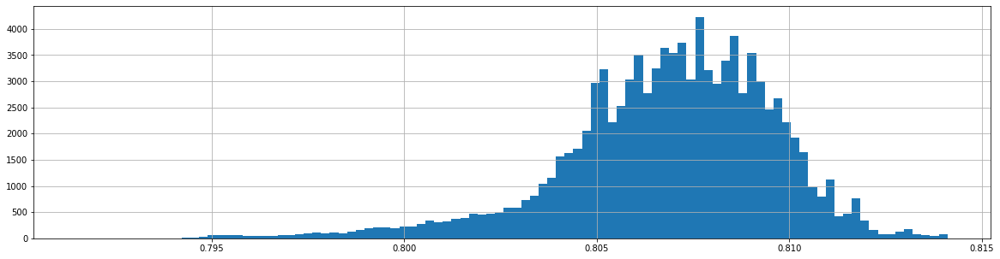

In [30]:
best.min_whole_validation_auc.hist(bins=100);

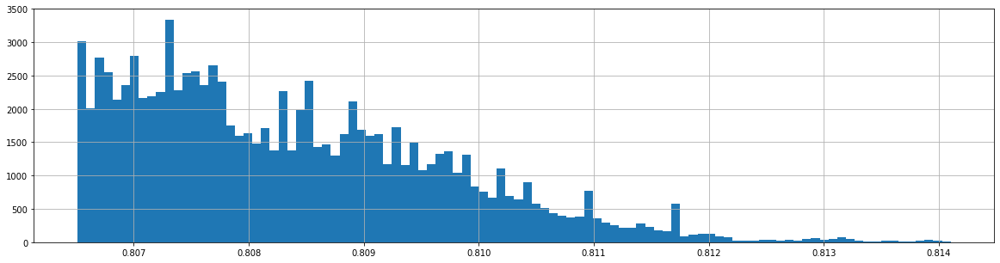

In [31]:
true_best.min_whole_validation_auc.hist(bins=100);

In [32]:
best_iteration = best.sort_values('mean_dev_auc').groupby(['file', 'experiment_id']).last()

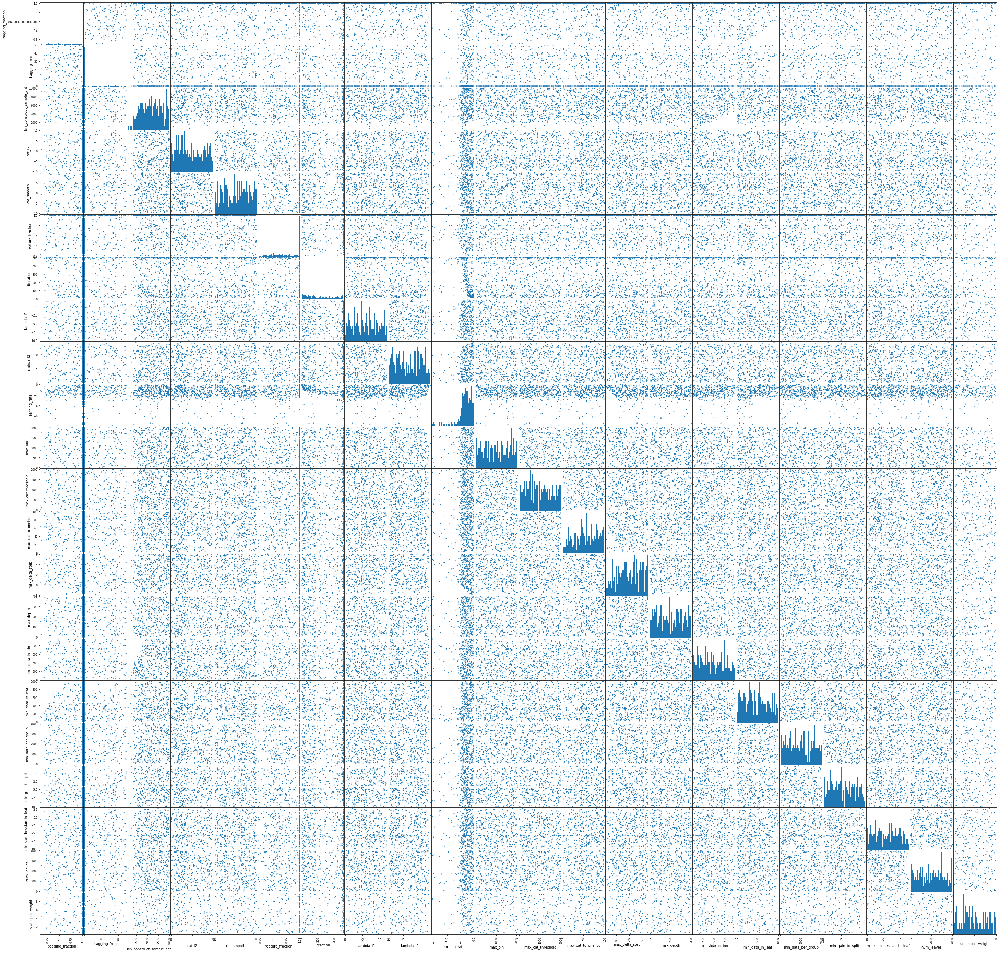

In [33]:
pd.plotting.scatter_matrix(
    pd.concat([best_iteration[CONT_PARAMETERS + INT_PARAMETERS], 
               np.log10(best_iteration[list(set(LOG_PARAMETERS))])],
              axis='columns',
              sort=True
             ).rename(lambda x: x.replace('param_', ''), axis='columns').sort_index(axis=1),
    alpha=1, figsize=(50, 50), hist_kwds={'bins': 50});

### check failures in best selected parameter range

In [34]:
best_range = best\
    [[c for c in best.columns if c.startswith('param_') and not c in SET_PARAMETERS]]\
    .drop(columns=['param_seed', 'param_bagging_enable'])\
    .quantile([0, 1]).T
best_range

,0.0,1.0
param_bagging_fraction,1.057071e-01,1.000000e+00
param_bagging_freq,0.000000e+00,4.900000e+01
param_bin_construct_sample_cnt,6.020000e+02,9.996000e+03
param_cat_l2,1.039833e-10,8.474853e+09
param_cat_smooth,1.001139e-10,8.867437e+09
param_feature_fraction,2.083144e-01,1.000000e+00
param_lambda_l1,1.103529e-10,9.918190e+01
param_lambda_l2,1.066369e-10,2.389528e+04
param_learning_rate,1.790918e-08,9.626017e-01
param_max_bin,8.000000e+00,2.042000e+03


In [35]:
dfs = []
for f in files:
    df = pd.read_pickle(f).assign(file=f)
    for (n, l, h) in best_range.itertuples():
        df = df[(((df[n] >= l) & (df[n] <= h))
                 | df[n].isna())].copy()
    dfs.append(df)

limited = pd.concat(dfs, ignore_index=True, sort=True)
del dfs
limited.shape

(775500, 61)

In [36]:
limited_best_iteration = limited.sort_values('min_whole_validation_auc').groupby(['file', 'experiment_id']).last()
limited_best_iteration.shape

(1551, 59)

In [37]:
limited_best_iteration['param_bagging_enable'] = (limited_best_iteration.param_bagging_freq != 0)

In [38]:
limited_best_iteration.min_whole_validation_auc.describe()

count    1551.000000
mean        0.755729
std         0.087033
min         0.493961
25%         0.749648
50%         0.793202
75%         0.806007
max         0.814103
Name: min_whole_validation_auc, dtype: float64

In [39]:
limited_bad = limited_best_iteration[limited_best_iteration.min_whole_validation_auc < 0.6]

In [40]:
limited_bad.shape

(133, 60)

TODO pikachu with bruises reaction

In [41]:
limited_bad.groupby(SET_PARAMETERS).size()

param_is_unbalance  param_boost_from_average
False               False                       36
                    True                        42
True                False                       24
                    True                        31
dtype: int64

In [42]:
limited_bad.groupby('param_bagging_enable').size()

param_bagging_enable
False     15
True     118
dtype: int64

In [43]:
limited_best_iteration.groupby(SET_PARAMETERS).min_whole_validation_auc.describe()

count      mean       std  \
param_is_unbalance param_boost_from_average                              
False              False                     367.0  0.756175  0.090370   
                   True                      397.0  0.740783  0.096541   
True               False                     390.0  0.770311  0.073955   
                   True                      397.0  0.755938  0.083513   

                                                  min       25%       50%  \
param_is_unbalance param_boost_from_average                                 
False              False                     0.500000  0.761635  0.794094   
                   True                      0.500000  0.716089  0.788401   
True               False                     0.500000  0.773200  0.797346   
                   True                      0.493961  0.746078  0.788805   

                                                  75%       max  
param_is_unbalance param_boost_from_average                      
False              False                     0.805816  0.813329  
                   True                      0.805495  0.814103  
True               False                     0.806371  0.812172  
                   True                      0.806396  0.812227

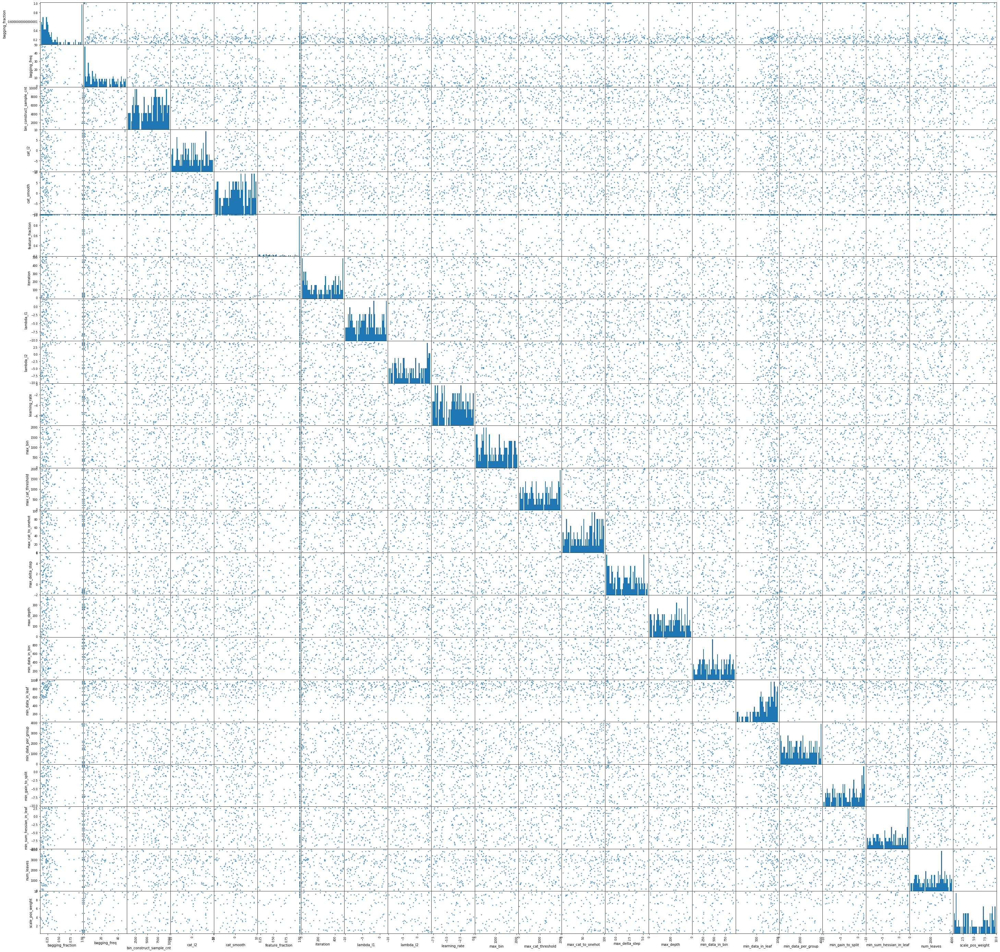

In [44]:
pd.plotting.scatter_matrix(
    pd.concat([limited_bad[CONT_PARAMETERS + INT_PARAMETERS], 
               np.log10(limited_bad[list(set(LOG_PARAMETERS))])],
              axis='columns',
              sort=True
             ).rename(lambda x: x.replace('param_', ''), axis='columns').sort_index(axis=1),
    alpha=0.8, figsize=(50, 50), hist_kwds={'bins': 50});

### top parameters

In [45]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(best_iteration.sort_values('mean_dev_auc', ascending=False).head().T)

file                                 ./experiments/good-5fold-3seed.pkl  \
experiment_id                                                      481    
cnt                                                                   3   
iteration                                                           195   
max_dev_auc                                                    0.860105   
max_dev_binary_logloss                                         0.525295   
max_overfit_auc                                               0.0217803   
max_overfit_binary_logloss                                    0.0194287   
max_validation_auc                                             0.814348   
max_validation_binary_logloss                                  0.539603   
max_whole_train_auc                                            0.841758   
max_whole_train_binary_logloss                                 0.497199   
max_whole_validation_auc                                       0.812049   
max_whole_validation_bina